In [1]:
import torch
import torch.nn as nn
import torchvision.transforms as transforms
import torch.optim as optim
import torchvision.datasets as datasets
import imageio
import numpy as np
import matplotlib
from torchvision.utils import make_grid, save_image
from torch.utils.data import DataLoader
from matplotlib import pyplot as plt
from tqdm import tqdm

# Define learning parameters

In [2]:
# learning parameters
batch_size = 512
epochs = 100
sample_size = 64 # fixed sample size for generator
nz = 128 # latent vector size
k = 1 # number of steps to apply to the discriminator
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Prepare training dataset

In [3]:
transform = transforms.Compose([
                                transforms.ToTensor(),
                                transforms.Normalize((0.5,),(0.5,)),
])
to_pil_image = transforms.ToPILImage()

# Make input, output folders
!mkdir -p input
!mkdir -p outputs

# Load train data
train_data = datasets.MNIST(
    root='input/data',
    train=True,
    download=True,
    transform=transform
)
train_loader = DataLoader(train_data, batch_size=batch_size, shuffle=True)

子目录或文件 -p 已经存在。
处理: -p 时出错。
子目录或文件 input 已经存在。
处理: input 时出错。
子目录或文件 -p 已经存在。
处理: -p 时出错。
子目录或文件 outputs 已经存在。
处理: outputs 时出错。


# Generator

In [4]:
class Generator(nn.Module):
    def __init__(self, nz):
        super(Generator, self).__init__()
        self.nz = nz
        self.main = nn.Sequential(
            nn.Linear(self.nz, 256),
            nn.LeakyReLU(0.2),
            nn.Linear(256, 512),
            nn.LeakyReLU(0.2),
            nn.Linear(512, 1024),
            nn.LeakyReLU(0.2),
            nn.Linear(1024, 784),
            nn.Tanh(),
        )
    def forward(self, x):
        return self.main(x).view(-1, 1, 28, 28)

# Discriminator

In [5]:
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.n_input = 784
        self.main = nn.Sequential(
            nn.Linear(self.n_input, 1024),
            nn.LeakyReLU(0.2),
            nn.Dropout(0.3),
            nn.Linear(1024, 512),
            nn.LeakyReLU(0.2),
            nn.Dropout(0.3),
            nn.Linear(512, 256),
            nn.LeakyReLU(0.2),
            nn.Dropout(0.3),
            nn.Linear(256, 1),
            nn.Sigmoid(),
        )
    def forward(self, x):
        x = x.view(-1, 784)
        return self.main(x)

In [6]:
generator = Generator(nz).to(device)
discriminator = Discriminator().to(device)
print('##### GENERATOR #####')
print(generator)
print('######################')
print('\n##### DISCRIMINATOR #####')
print(discriminator)
print('######################')

##### GENERATOR #####
Generator(
  (main): Sequential(
    (0): Linear(in_features=128, out_features=256, bias=True)
    (1): LeakyReLU(negative_slope=0.2)
    (2): Linear(in_features=256, out_features=512, bias=True)
    (3): LeakyReLU(negative_slope=0.2)
    (4): Linear(in_features=512, out_features=1024, bias=True)
    (5): LeakyReLU(negative_slope=0.2)
    (6): Linear(in_features=1024, out_features=784, bias=True)
    (7): Tanh()
  )
)
######################

##### DISCRIMINATOR #####
Discriminator(
  (main): Sequential(
    (0): Linear(in_features=784, out_features=1024, bias=True)
    (1): LeakyReLU(negative_slope=0.2)
    (2): Dropout(p=0.3, inplace=False)
    (3): Linear(in_features=1024, out_features=512, bias=True)
    (4): LeakyReLU(negative_slope=0.2)
    (5): Dropout(p=0.3, inplace=False)
    (6): Linear(in_features=512, out_features=256, bias=True)
    (7): LeakyReLU(negative_slope=0.2)
    (8): Dropout(p=0.3, inplace=False)
    (9): Linear(in_features=256, out_features=1

# Tools for training

In [7]:
# optimizers
optim_g = optim.Adam(generator.parameters(), lr=0.0002)
optim_d = optim.Adam(discriminator.parameters(), lr=0.0002)

In [7]:
# loss function
criterion = nn.BCELoss() # Binary Cross Entropy loss

In [8]:
losses_g = [] # to store generator loss after each epoch
losses_d = [] # to store discriminator loss after each epoch
images = [] # to store images generatd by the generator

In [9]:
# to create real labels (1s)
def label_real(size):
    data = torch.ones(size, 1)
    return data.to(device)
# to create fake labels (0s)
def label_fake(size):
    data = torch.zeros(size, 1)
    return data.to(device)

In [10]:
# function to create the noise vector
def create_noise(sample_size, nz):
    return torch.randn(sample_size, nz).to(device)

In [11]:
# to save the images generated by the generator
def save_generator_image(image, path):
    save_image(image, path)

In [12]:
# create the noise vector - fixed to track how GAN is trained.
noise = create_noise(sample_size, nz)

# Q. Write training loop

118it [00:30,  3.84it/s]                                                                                                


Epoch 1 of 100
Generator loss: 3.95773273, Discriminator loss: 0.81416709


118it [00:31,  3.78it/s]                                                                                                


Epoch 2 of 100
Generator loss: 3.59113002, Discriminator loss: 0.81189862


118it [00:31,  3.79it/s]                                                                                                


Epoch 3 of 100
Generator loss: 1.91933703, Discriminator loss: 0.88981525


118it [00:29,  4.07it/s]                                                                                                


Epoch 4 of 100
Generator loss: 1.23317417, Discriminator loss: 1.10000300


118it [00:29,  3.96it/s]                                                                                                
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


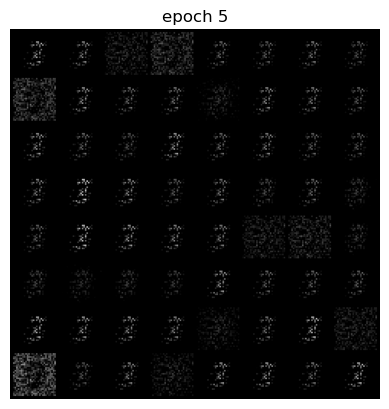

Epoch 5 of 100
Generator loss: 1.97467134, Discriminator loss: 0.98426445


118it [00:32,  3.58it/s]                                                                                                


Epoch 6 of 100
Generator loss: 2.00077829, Discriminator loss: 0.83449614


118it [00:30,  3.91it/s]                                                                                                


Epoch 7 of 100
Generator loss: 2.00687315, Discriminator loss: 0.78869403


118it [00:32,  3.68it/s]                                                                                                


Epoch 8 of 100
Generator loss: 2.47392161, Discriminator loss: 0.72656370


118it [00:31,  3.71it/s]                                                                                                


Epoch 9 of 100
Generator loss: 2.97208607, Discriminator loss: 0.57655966


118it [00:31,  3.77it/s]                                                                                                
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


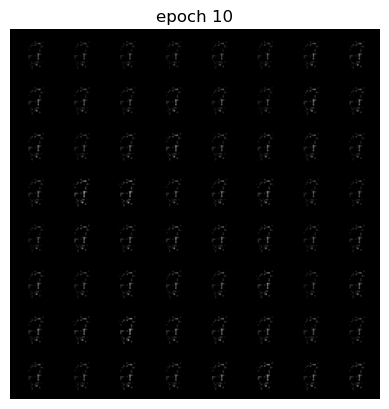

Epoch 10 of 100
Generator loss: 3.18257973, Discriminator loss: 0.85446138


118it [00:30,  3.92it/s]                                                                                                


Epoch 11 of 100
Generator loss: 2.93066382, Discriminator loss: 0.54943973


118it [00:29,  3.95it/s]                                                                                                


Epoch 12 of 100
Generator loss: 2.96699458, Discriminator loss: 0.50522516


118it [00:29,  3.97it/s]                                                                                                


Epoch 13 of 100
Generator loss: 2.63510065, Discriminator loss: 0.63260785


118it [00:29,  4.03it/s]                                                                                                


Epoch 14 of 100
Generator loss: 2.68774736, Discriminator loss: 0.59954734


118it [00:30,  3.92it/s]                                                                                                
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


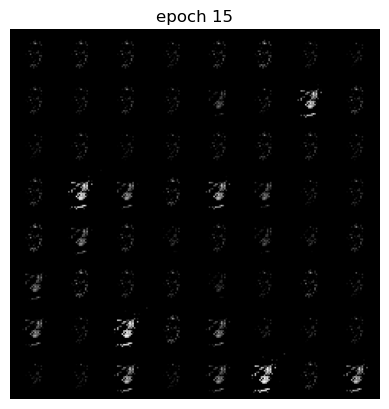

Epoch 15 of 100
Generator loss: 2.46852127, Discriminator loss: 0.59536886


118it [00:30,  3.92it/s]                                                                                                


Epoch 16 of 100
Generator loss: 2.99493637, Discriminator loss: 0.47836255


118it [00:29,  4.04it/s]                                                                                                


Epoch 17 of 100
Generator loss: 2.73355980, Discriminator loss: 0.59294547


118it [00:29,  3.94it/s]                                                                                                


Epoch 18 of 100
Generator loss: 2.25229510, Discriminator loss: 0.72295330


118it [00:30,  3.87it/s]                                                                                                


Epoch 19 of 100
Generator loss: 2.06111301, Discriminator loss: 0.65234381


118it [00:30,  3.89it/s]                                                                                                
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


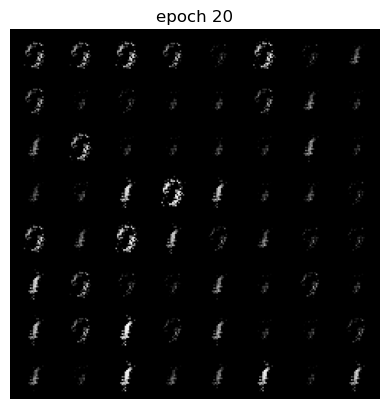

Epoch 20 of 100
Generator loss: 2.45637108, Discriminator loss: 0.47394491


118it [00:30,  3.90it/s]                                                                                                


Epoch 21 of 100
Generator loss: 2.93924680, Discriminator loss: 0.44047626


118it [00:30,  3.91it/s]                                                                                                


Epoch 22 of 100
Generator loss: 3.15217995, Discriminator loss: 0.38326175


118it [00:30,  3.87it/s]                                                                                                


Epoch 23 of 100
Generator loss: 3.52935233, Discriminator loss: 0.40777805


118it [00:31,  3.78it/s]                                                                                                


Epoch 24 of 100
Generator loss: 3.11464429, Discriminator loss: 0.52450978


118it [00:30,  3.86it/s]                                                                                                
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


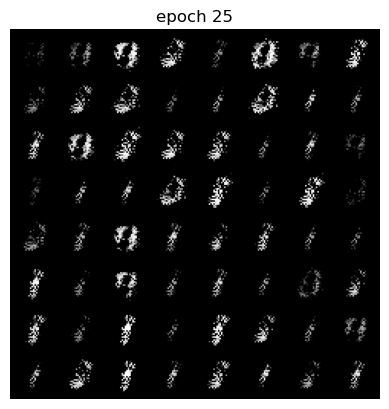

Epoch 25 of 100
Generator loss: 3.16910042, Discriminator loss: 0.53950323


118it [00:30,  3.84it/s]                                                                                                


Epoch 26 of 100
Generator loss: 3.47325325, Discriminator loss: 0.61647422


118it [00:30,  3.84it/s]                                                                                                


Epoch 27 of 100
Generator loss: 3.14192059, Discriminator loss: 0.53213221


118it [00:29,  3.93it/s]                                                                                                


Epoch 28 of 100
Generator loss: 3.42931251, Discriminator loss: 0.44909619


118it [00:30,  3.92it/s]                                                                                                


Epoch 29 of 100
Generator loss: 3.37348633, Discriminator loss: 0.44547612


118it [00:29,  3.95it/s]                                                                                                
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


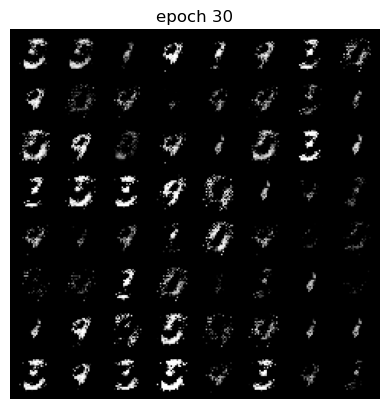

Epoch 30 of 100
Generator loss: 3.22914633, Discriminator loss: 0.46711128


118it [00:29,  4.00it/s]                                                                                                


Epoch 31 of 100
Generator loss: 3.02185584, Discriminator loss: 0.46922186


118it [00:30,  3.86it/s]                                                                                                


Epoch 32 of 100
Generator loss: 3.19593663, Discriminator loss: 0.47922102


118it [00:29,  3.98it/s]                                                                                                


Epoch 33 of 100
Generator loss: 3.28284658, Discriminator loss: 0.40551022


118it [00:30,  3.91it/s]                                                                                                


Epoch 34 of 100
Generator loss: 3.54271051, Discriminator loss: 0.39869873


118it [00:30,  3.84it/s]                                                                                                
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


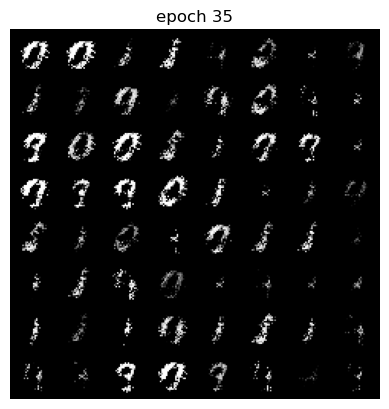

Epoch 35 of 100
Generator loss: 3.15265686, Discriminator loss: 0.50730528


118it [00:30,  3.84it/s]                                                                                                


Epoch 36 of 100
Generator loss: 3.56840332, Discriminator loss: 0.35222102


118it [00:30,  3.91it/s]                                                                                                


Epoch 37 of 100
Generator loss: 3.22777106, Discriminator loss: 0.43510420


118it [00:29,  3.97it/s]                                                                                                


Epoch 38 of 100
Generator loss: 3.08749471, Discriminator loss: 0.47622183


118it [00:29,  4.00it/s]                                                                                                


Epoch 39 of 100
Generator loss: 3.26026983, Discriminator loss: 0.45253753


118it [00:29,  3.98it/s]                                                                                                
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


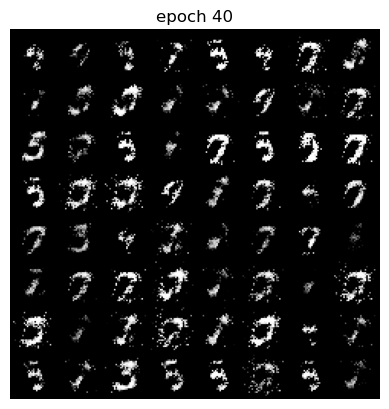

Epoch 40 of 100
Generator loss: 3.58212311, Discriminator loss: 0.46560334


118it [00:29,  4.00it/s]                                                                                                


Epoch 41 of 100
Generator loss: 2.84164454, Discriminator loss: 0.52872330


118it [00:29,  4.00it/s]                                                                                                


Epoch 42 of 100
Generator loss: 3.23754048, Discriminator loss: 0.43517681


118it [00:29,  4.01it/s]                                                                                                


Epoch 43 of 100
Generator loss: 2.91514080, Discriminator loss: 0.52536510


118it [00:29,  4.00it/s]                                                                                                


Epoch 44 of 100
Generator loss: 2.96869451, Discriminator loss: 0.48194206


118it [00:29,  3.98it/s]                                                                                                
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


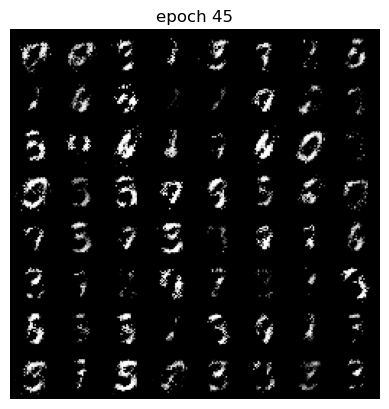

Epoch 45 of 100
Generator loss: 3.18047194, Discriminator loss: 0.43680056


118it [00:29,  4.02it/s]                                                                                                


Epoch 46 of 100
Generator loss: 3.33048683, Discriminator loss: 0.42662819


118it [00:30,  3.92it/s]                                                                                                


Epoch 47 of 100
Generator loss: 3.35261566, Discriminator loss: 0.40418263


118it [00:31,  3.79it/s]                                                                                                


Epoch 48 of 100
Generator loss: 3.06128734, Discriminator loss: 0.48526004


118it [00:30,  3.83it/s]                                                                                                


Epoch 49 of 100
Generator loss: 3.42494687, Discriminator loss: 0.41311249


118it [00:30,  3.89it/s]                                                                                                
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


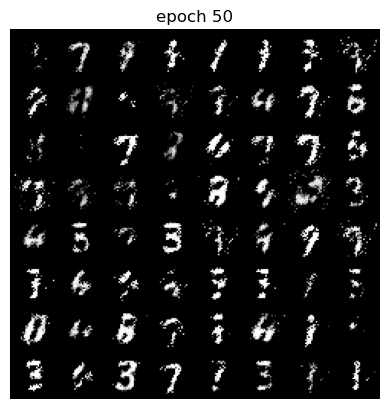

Epoch 50 of 100
Generator loss: 3.08420918, Discriminator loss: 0.46076320


118it [00:30,  3.92it/s]                                                                                                


Epoch 51 of 100
Generator loss: 3.10526917, Discriminator loss: 0.44273649


118it [00:30,  3.91it/s]                                                                                                


Epoch 52 of 100
Generator loss: 3.18019419, Discriminator loss: 0.47653182


118it [00:30,  3.81it/s]                                                                                                


Epoch 53 of 100
Generator loss: 3.23610164, Discriminator loss: 0.47550541


118it [00:31,  3.75it/s]                                                                                                


Epoch 54 of 100
Generator loss: 3.02916827, Discriminator loss: 0.50807647


118it [00:31,  3.71it/s]                                                                                                
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


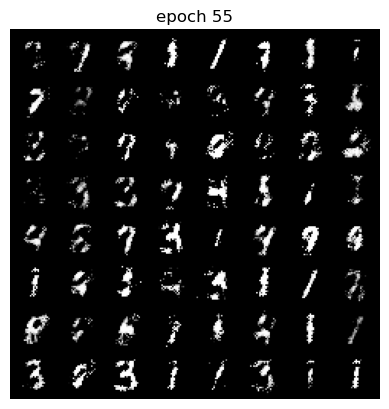

Epoch 55 of 100
Generator loss: 3.10610543, Discriminator loss: 0.51296665


118it [00:32,  3.64it/s]                                                                                                


Epoch 56 of 100
Generator loss: 2.87190932, Discriminator loss: 0.54434718


118it [00:31,  3.71it/s]                                                                                                


Epoch 57 of 100
Generator loss: 2.78404840, Discriminator loss: 0.49734256


118it [00:31,  3.72it/s]                                                                                                


Epoch 58 of 100
Generator loss: 2.81661063, Discriminator loss: 0.49981031


118it [00:31,  3.71it/s]                                                                                                


Epoch 59 of 100
Generator loss: 2.84311704, Discriminator loss: 0.47918334


118it [00:31,  3.72it/s]                                                                                                
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


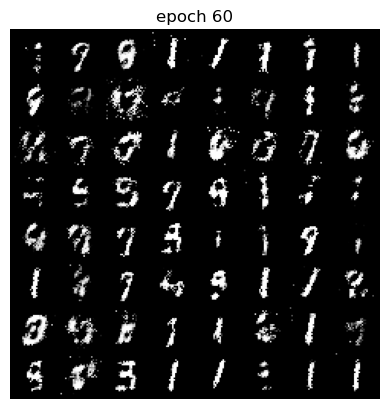

Epoch 60 of 100
Generator loss: 3.00235033, Discriminator loss: 0.49398423


118it [00:31,  3.72it/s]                                                                                                


Epoch 61 of 100
Generator loss: 2.87060166, Discriminator loss: 0.54990989


118it [00:31,  3.70it/s]                                                                                                


Epoch 62 of 100
Generator loss: 2.72491224, Discriminator loss: 0.57733948


118it [00:31,  3.74it/s]                                                                                                


Epoch 63 of 100
Generator loss: 2.70076906, Discriminator loss: 0.56962783


118it [00:32,  3.67it/s]                                                                                                


Epoch 64 of 100
Generator loss: 2.76881636, Discriminator loss: 0.56324936


118it [00:32,  3.63it/s]                                                                                                
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


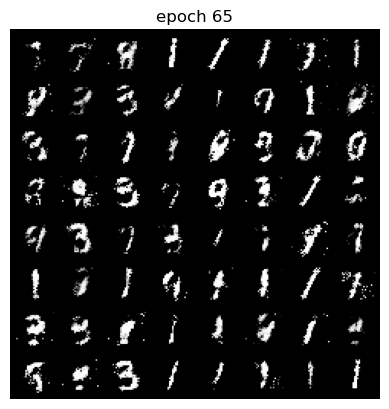

Epoch 65 of 100
Generator loss: 2.76868016, Discriminator loss: 0.51048637


118it [00:32,  3.64it/s]                                                                                                


Epoch 66 of 100
Generator loss: 2.87160132, Discriminator loss: 0.54738492


118it [00:32,  3.62it/s]                                                                                                


Epoch 67 of 100
Generator loss: 2.42061267, Discriminator loss: 0.65390711


118it [00:32,  3.63it/s]                                                                                                


Epoch 68 of 100
Generator loss: 2.58168704, Discriminator loss: 0.54482072


118it [00:32,  3.62it/s]                                                                                                


Epoch 69 of 100
Generator loss: 2.66994769, Discriminator loss: 0.55874960


118it [00:32,  3.58it/s]                                                                                                
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


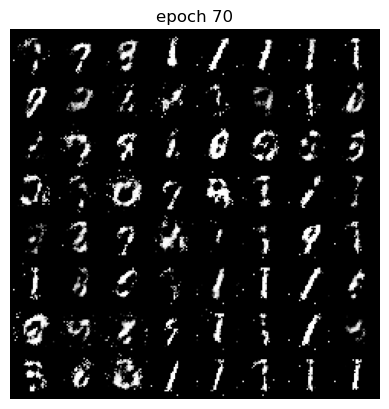

Epoch 70 of 100
Generator loss: 2.59260811, Discriminator loss: 0.57265317


118it [00:31,  3.77it/s]                                                                                                


Epoch 71 of 100
Generator loss: 2.70930869, Discriminator loss: 0.57235072


118it [00:31,  3.69it/s]                                                                                                


Epoch 72 of 100
Generator loss: 2.51959907, Discriminator loss: 0.58413894


118it [00:31,  3.79it/s]                                                                                                


Epoch 73 of 100
Generator loss: 2.67569905, Discriminator loss: 0.56850203


118it [00:30,  3.87it/s]                                                                                                


Epoch 74 of 100
Generator loss: 2.55734282, Discriminator loss: 0.62562902


118it [00:31,  3.73it/s]                                                                                                
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


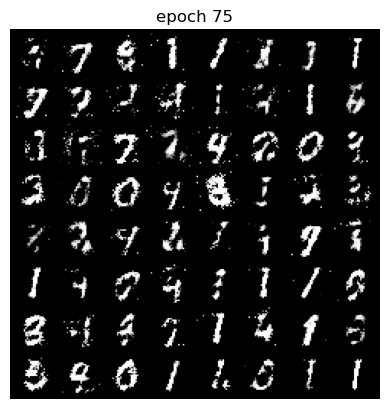

Epoch 75 of 100
Generator loss: 2.50163855, Discriminator loss: 0.63423292


118it [00:35,  3.34it/s]                                                                                                


Epoch 76 of 100
Generator loss: 2.41752058, Discriminator loss: 0.63072824


118it [00:32,  3.65it/s]                                                                                                


Epoch 77 of 100
Generator loss: 2.47625023, Discriminator loss: 0.64429084


118it [00:31,  3.71it/s]                                                                                                


Epoch 78 of 100
Generator loss: 2.35109681, Discriminator loss: 0.65401842


118it [00:31,  3.74it/s]                                                                                                


Epoch 79 of 100
Generator loss: 2.30462265, Discriminator loss: 0.69483878


118it [00:32,  3.67it/s]                                                                                                
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


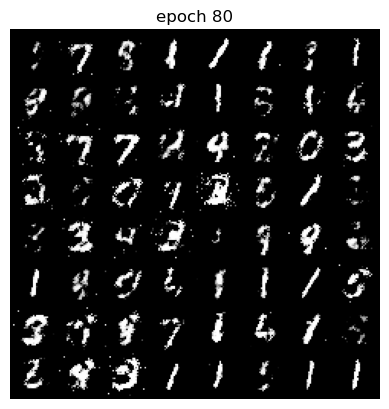

Epoch 80 of 100
Generator loss: 2.26629256, Discriminator loss: 0.67960282


118it [00:32,  3.63it/s]                                                                                                


Epoch 81 of 100
Generator loss: 2.21396373, Discriminator loss: 0.71408362


118it [00:31,  3.72it/s]                                                                                                


Epoch 82 of 100
Generator loss: 2.18749851, Discriminator loss: 0.73573123


118it [00:32,  3.63it/s]                                                                                                


Epoch 83 of 100
Generator loss: 2.31478679, Discriminator loss: 0.69942828


118it [00:31,  3.75it/s]                                                                                                


Epoch 84 of 100
Generator loss: 2.31796258, Discriminator loss: 0.66272577


118it [00:32,  3.68it/s]                                                                                                
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


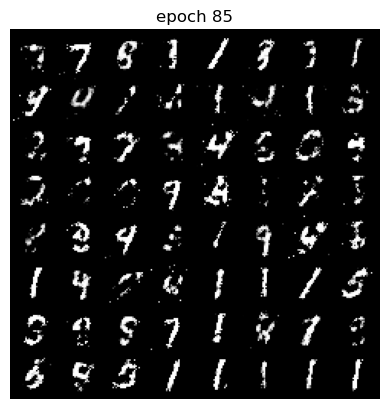

Epoch 85 of 100
Generator loss: 2.24559892, Discriminator loss: 0.67452282


118it [00:31,  3.70it/s]                                                                                                


Epoch 86 of 100
Generator loss: 2.32012778, Discriminator loss: 0.66814785


118it [00:31,  3.72it/s]                                                                                                


Epoch 87 of 100
Generator loss: 2.26033732, Discriminator loss: 0.71863578


118it [00:32,  3.65it/s]                                                                                                


Epoch 88 of 100
Generator loss: 2.08160635, Discriminator loss: 0.71198462


118it [00:31,  3.74it/s]                                                                                                


Epoch 89 of 100
Generator loss: 2.05074565, Discriminator loss: 0.74489019


118it [00:32,  3.68it/s]                                                                                                
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


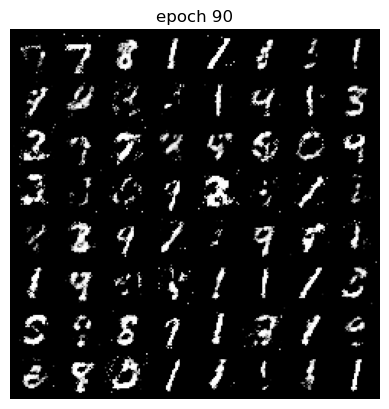

Epoch 90 of 100
Generator loss: 2.06654869, Discriminator loss: 0.74756351


118it [00:30,  3.85it/s]                                                                                                


Epoch 91 of 100
Generator loss: 2.00708158, Discriminator loss: 0.76756733


118it [00:30,  3.88it/s]                                                                                                


Epoch 92 of 100
Generator loss: 2.06601944, Discriminator loss: 0.78025936


118it [00:30,  3.89it/s]                                                                                                


Epoch 93 of 100
Generator loss: 1.88795658, Discriminator loss: 0.82393645


118it [00:30,  3.90it/s]                                                                                                


Epoch 94 of 100
Generator loss: 2.01423321, Discriminator loss: 0.76764460


118it [00:30,  3.89it/s]                                                                                                
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


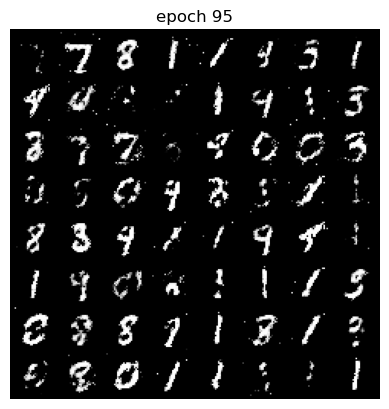

Epoch 95 of 100
Generator loss: 2.10772517, Discriminator loss: 0.73845118


118it [00:30,  3.83it/s]                                                                                                


Epoch 96 of 100
Generator loss: 2.10454942, Discriminator loss: 0.74706780


118it [00:31,  3.80it/s]                                                                                                


Epoch 97 of 100
Generator loss: 2.06576299, Discriminator loss: 0.75620015


118it [00:31,  3.79it/s]                                                                                                


Epoch 98 of 100
Generator loss: 1.99536154, Discriminator loss: 0.77389792


118it [00:30,  3.85it/s]                                                                                                


Epoch 99 of 100
Generator loss: 2.03409764, Discriminator loss: 0.75915380


118it [00:31,  3.80it/s]                                                                                                
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


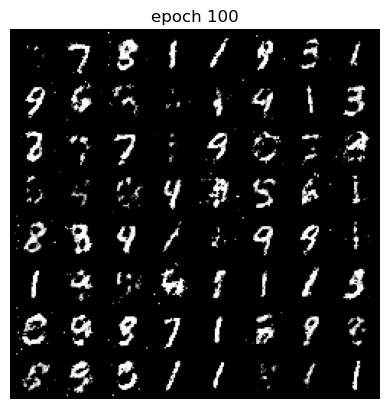

Epoch 100 of 100
Generator loss: 2.02373253, Discriminator loss: 0.78050626


In [17]:
torch.manual_seed(7777)

def generator_loss(output, true_label):
    ############ YOUR CODE HERE ##########
    # Generator uses real labels to confuse the discriminator
    noise = create_noise(batch_size, nz)
    gen_output = generator(noise)
    output_fake = discriminator(gen_output)
    return criterion(output_fake, true_label)
    ######################################
    
def discriminator_loss(output, true_label):
    ############ YOUR CODE HERE ##########    
    real_loss = criterion(output, true_label)
    
    noise = create_noise(batch_size, nz)
    # fake data
    fake_data = generator(noise)
    # Detach to avoid backpropagation through the generator
    fake_output = discriminator(fake_data.detach())  
    fake_labels = label_fake(fake_data.size(0))
    fake_loss = criterion(fake_output, fake_labels)

    return real_loss + fake_loss
    ######################################
    
    
for epoch in range(epochs):
    loss_g = 0.0
    loss_d = 0.0
    for bi, data in tqdm(enumerate(train_loader), total=int(len(train_data)/train_loader.batch_size)):
        ############ YOUR CODE HERE ########## 
        real_data, true_label = data
        real_data = real_data.to(device)
        true_label = label_real(real_data.size(0))

        # discriminator
        discriminator.zero_grad()
        dis_output = discriminator(real_data)
        dis_loss = discriminator_loss(dis_output, true_label)
        dis_loss.backward()
        optim_d.step()

        # generator
        generator.zero_grad()
        # we only use the batch size, i.e. the size of real data, below
        gen_loss = generator_loss(real_data, label_real(batch_size))
        gen_loss.backward()
        optim_g.step()

        # total loss
        loss_g += gen_loss.item()
        loss_d += dis_loss.item()
        ######################################
    
    
    # create the final fake image for the epoch
    generated_img = generator(noise).cpu().detach()
    
    # make the images as grid
    generated_img = make_grid(generated_img)
    
    # visualize generated images
    if (epoch + 1) % 5 == 0:
        plt.imshow(generated_img.permute(1, 2, 0))
        plt.title(f'epoch {epoch+1}')
        plt.axis('off')
        plt.show()
    
    # save the generated torch tensor models to disk
    save_generator_image(generated_img, f"outputs/gen_img{epoch+1}.png")
    images.append(generated_img)
    epoch_loss_g = loss_g / bi # total generator loss for the epoch
    epoch_loss_d = loss_d / bi # total discriminator loss for the epoch
    losses_g.append(epoch_loss_g)
    losses_d.append(epoch_loss_d)
    
    print(f"Epoch {epoch+1} of {epochs}")
    print(f"Generator loss: {epoch_loss_g:.8f}, Discriminator loss: {epoch_loss_d:.8f}")

In [18]:
print('DONE TRAINING')
torch.save(generator.state_dict(), 'outputs/generator.pth')

DONE TRAINING


In [19]:
# save the generated images as GIF file
imgs = [np.array(to_pil_image(img)) for img in images]
imageio.mimsave('outputs/generator_images.gif', imgs)

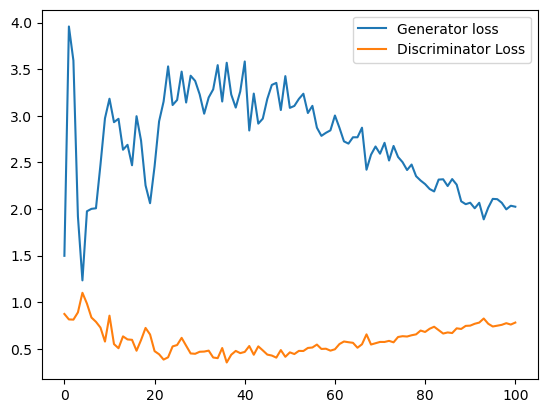

In [20]:
# plot and save the generator and discriminator loss
plt.figure()
plt.plot(losses_g, label='Generator loss')
plt.plot(losses_d, label='Discriminator Loss')
plt.legend()
plt.savefig('outputs/loss.png')

# b

In [ ]:
transform = transforms.Compose([
                                transforms.ToTensor(),
                                transforms.Normalize((0.5,),(0.5,)),
])
to_pil_image = transforms.ToPILImage()

# Make input, output folders
!mkdir -p input
!mkdir -p outputs

# Load train data
train_data = datasets.MNIST(
    root='input/data',
    train=True,
    download=True,
    transform=transform
)
train_loader = DataLoader(train_data, batch_size=batch_size, shuffle=True)

In [13]:
# optimizers
optim_g = optim.Adam(generator.parameters(), lr=0.0002)
optim_d = optim.Adam(discriminator.parameters(), lr=0.0002)
# loss function
criterion = nn.BCELoss() # Binary Cross Entropy loss
losses_g = [] # to store generator loss after each epoch
losses_d = [] # to store discriminator loss after each epoch
images = [] # to store images generatd by the generator
# create the noise vector - fixed to track how GAN is trained.
noise = create_noise(sample_size, nz)

118it [00:31,  3.77it/s]                                                                                                


Epoch 1 of 100
Generator loss: 0.24506903, Discriminator loss: 0.46000911


118it [00:30,  3.86it/s]                                                                                                


Epoch 2 of 100
Generator loss: 0.00001824, Discriminator loss: 0.00003769


118it [00:30,  3.87it/s]                                                                                                


Epoch 3 of 100
Generator loss: 0.00001858, Discriminator loss: 0.00003456


118it [00:30,  3.91it/s]                                                                                                


Epoch 4 of 100
Generator loss: 0.00001814, Discriminator loss: 0.00002975


118it [00:31,  3.75it/s]                                                                                                
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


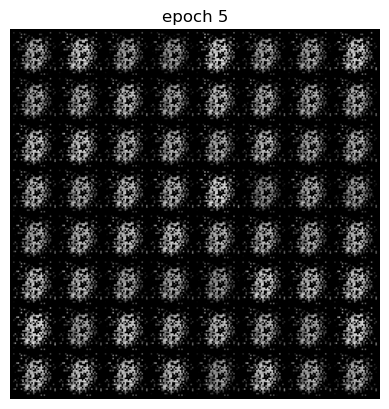

Epoch 5 of 100
Generator loss: 0.00001760, Discriminator loss: 0.00002688


118it [00:32,  3.67it/s]                                                                                                


Epoch 6 of 100
Generator loss: 0.00001672, Discriminator loss: 0.00002577


118it [00:34,  3.47it/s]                                                                                                


Epoch 7 of 100
Generator loss: 0.00001674, Discriminator loss: 0.00002762


118it [00:31,  3.70it/s]                                                                                                


Epoch 8 of 100
Generator loss: 0.00001813, Discriminator loss: 0.00002336


118it [00:32,  3.64it/s]                                                                                                


Epoch 9 of 100
Generator loss: 0.00001800, Discriminator loss: 0.00002498


118it [00:32,  3.59it/s]                                                                                                
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


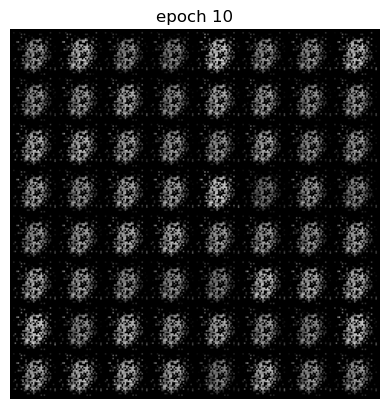

Epoch 10 of 100
Generator loss: 0.00002302, Discriminator loss: 0.00002973


118it [00:33,  3.57it/s]                                                                                                


Epoch 11 of 100
Generator loss: 0.01216330, Discriminator loss: 0.06377832


118it [00:33,  3.52it/s]                                                                                                


Epoch 12 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000022


118it [00:34,  3.46it/s]                                                                                                


Epoch 13 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000012


118it [00:33,  3.57it/s]                                                                                                


Epoch 14 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000012


118it [00:33,  3.54it/s]                                                                                                
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


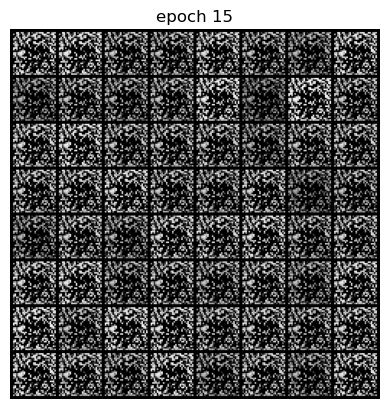

Epoch 15 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000012


118it [00:32,  3.65it/s]                                                                                                


Epoch 16 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000012


118it [00:33,  3.53it/s]                                                                                                


Epoch 17 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000012


118it [00:32,  3.64it/s]                                                                                                


Epoch 18 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000012


118it [00:32,  3.61it/s]                                                                                                


Epoch 19 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000012


118it [00:33,  3.54it/s]                                                                                                
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


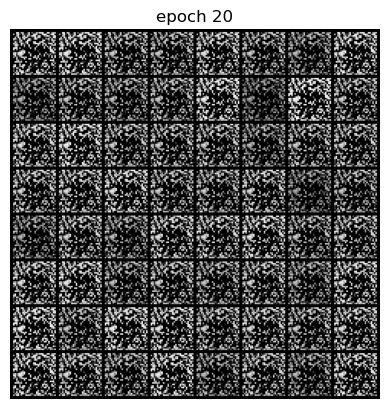

Epoch 20 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000012


118it [00:33,  3.56it/s]                                                                                                


Epoch 21 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000013


118it [00:33,  3.47it/s]                                                                                                


Epoch 22 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000011


118it [00:33,  3.47it/s]                                                                                                


Epoch 23 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000011


118it [00:33,  3.50it/s]                                                                                                


Epoch 24 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000011


118it [00:33,  3.54it/s]                                                                                                
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


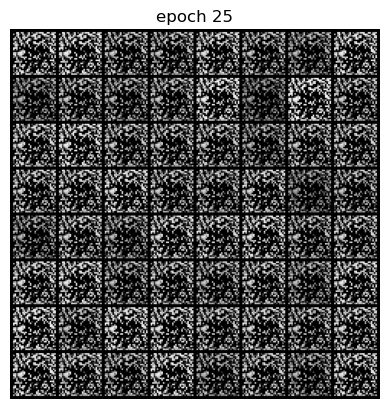

Epoch 25 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000011


118it [00:33,  3.52it/s]                                                                                                


Epoch 26 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000011


118it [00:33,  3.50it/s]                                                                                                


Epoch 27 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000010


118it [00:33,  3.54it/s]                                                                                                


Epoch 28 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000010


118it [00:31,  3.72it/s]                                                                                                


Epoch 29 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000010


118it [00:33,  3.52it/s]                                                                                                
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


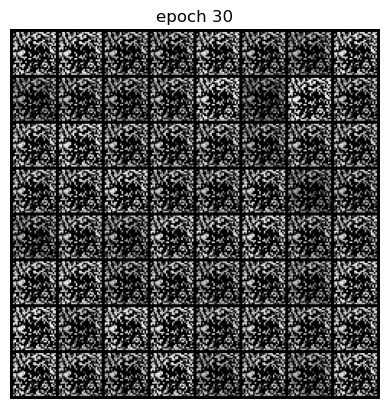

Epoch 30 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000010


118it [00:33,  3.52it/s]                                                                                                


Epoch 31 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000010


118it [00:38,  3.08it/s]                                                                                                


Epoch 32 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000010


118it [00:33,  3.47it/s]                                                                                                


Epoch 33 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000009


118it [00:34,  3.38it/s]                                                                                                


Epoch 34 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000009


118it [00:34,  3.44it/s]                                                                                                
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


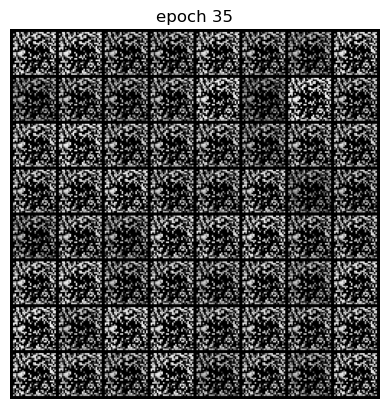

Epoch 35 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000009


118it [00:34,  3.38it/s]                                                                                                


Epoch 36 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000008


118it [00:35,  3.35it/s]                                                                                                


Epoch 37 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000008


118it [00:34,  3.46it/s]                                                                                                


Epoch 38 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000009


118it [00:33,  3.51it/s]                                                                                                


Epoch 39 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000009


118it [00:34,  3.45it/s]                                                                                                
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


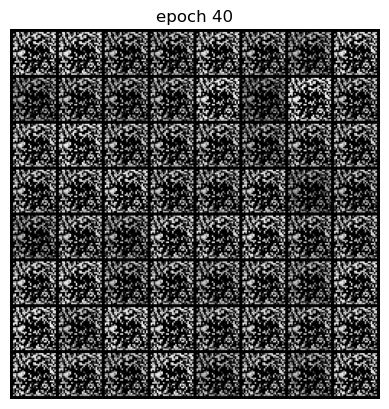

Epoch 40 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000008


118it [00:33,  3.49it/s]                                                                                                


Epoch 41 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000008


118it [00:34,  3.38it/s]                                                                                                


Epoch 42 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000008


118it [00:35,  3.35it/s]                                                                                                


Epoch 43 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000008


118it [00:34,  3.40it/s]                                                                                                


Epoch 44 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000007


118it [00:34,  3.43it/s]                                                                                                
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


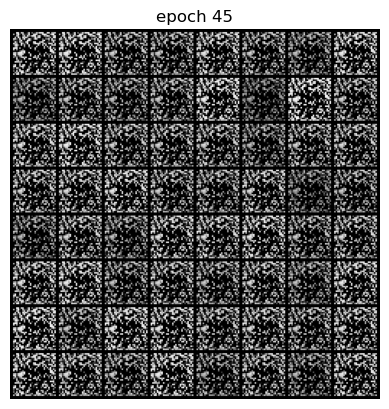

Epoch 45 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000007


118it [00:33,  3.48it/s]                                                                                                


Epoch 46 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000007


118it [00:33,  3.48it/s]                                                                                                


Epoch 47 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000006


118it [00:33,  3.49it/s]                                                                                                


Epoch 48 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000007


118it [00:34,  3.44it/s]                                                                                                


Epoch 49 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000006


118it [00:33,  3.49it/s]                                                                                                
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


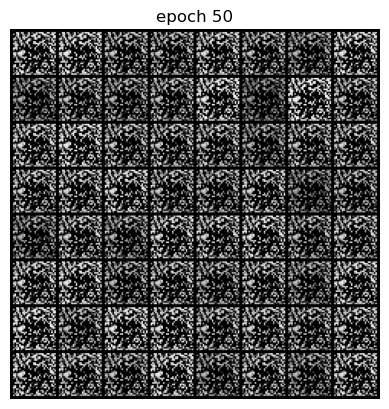

Epoch 50 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000006


118it [00:34,  3.47it/s]                                                                                                


Epoch 51 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000006


118it [00:34,  3.46it/s]                                                                                                


Epoch 52 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000006


118it [00:34,  3.41it/s]                                                                                                


Epoch 53 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000005


118it [00:34,  3.38it/s]                                                                                                


Epoch 54 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000005


118it [00:33,  3.52it/s]                                                                                                
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


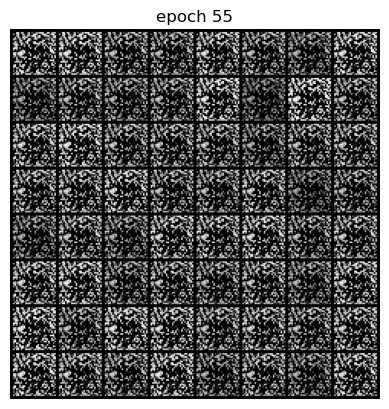

Epoch 55 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000005


118it [00:34,  3.44it/s]                                                                                                


Epoch 56 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000005


118it [00:34,  3.47it/s]                                                                                                


Epoch 57 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000005


118it [00:34,  3.45it/s]                                                                                                


Epoch 58 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000005


118it [00:34,  3.43it/s]                                                                                                


Epoch 59 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000004


118it [00:34,  3.47it/s]                                                                                                
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


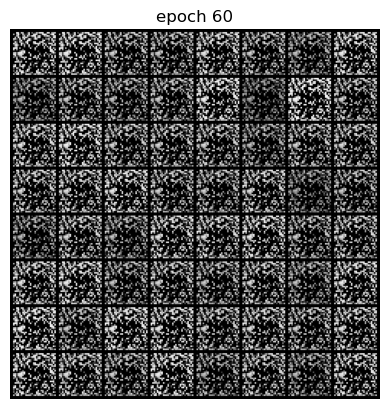

Epoch 60 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000004


118it [00:33,  3.52it/s]                                                                                                


Epoch 61 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000004


118it [00:32,  3.59it/s]                                                                                                


Epoch 62 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000004


118it [00:31,  3.77it/s]                                                                                                


Epoch 63 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000004


118it [00:31,  3.74it/s]                                                                                                


Epoch 64 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000003


118it [00:31,  3.73it/s]                                                                                                
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


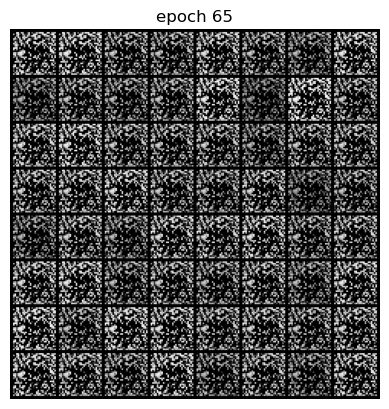

Epoch 65 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000003


118it [00:31,  3.73it/s]                                                                                                


Epoch 66 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000003


118it [00:33,  3.55it/s]                                                                                                


Epoch 67 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000003


118it [00:31,  3.71it/s]                                                                                                


Epoch 68 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000003


118it [00:31,  3.72it/s]                                                                                                


Epoch 69 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000003


118it [00:32,  3.66it/s]                                                                                                
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


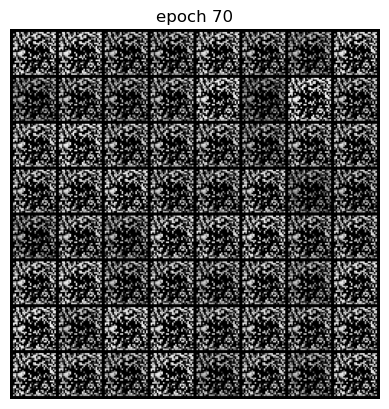

Epoch 70 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000003


118it [00:32,  3.68it/s]                                                                                                


Epoch 71 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000002


118it [00:32,  3.62it/s]                                                                                                


Epoch 72 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000002


118it [00:33,  3.57it/s]                                                                                                


Epoch 73 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000002


118it [00:33,  3.51it/s]                                                                                                


Epoch 74 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000002


118it [00:33,  3.54it/s]                                                                                                
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


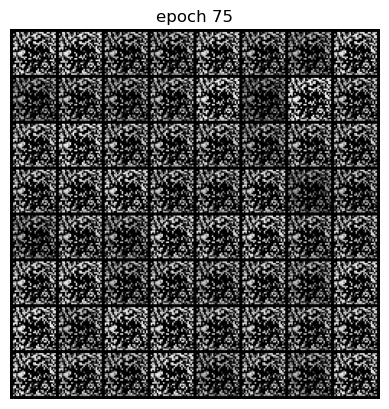

Epoch 75 of 100
Generator loss: 0.00000004, Discriminator loss: 0.00000002


118it [00:32,  3.59it/s]                                                                                                


Epoch 76 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000002


118it [00:33,  3.53it/s]                                                                                                


Epoch 77 of 100
Generator loss: 0.00000003, Discriminator loss: 0.00000002


118it [00:33,  3.51it/s]                                                                                                


Epoch 78 of 100
Generator loss: 0.00000003, Discriminator loss: 0.00000016


118it [00:35,  3.35it/s]                                                                                                


Epoch 79 of 100
Generator loss: 0.00000001, Discriminator loss: 0.00000662


118it [00:36,  3.27it/s]                                                                                                
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


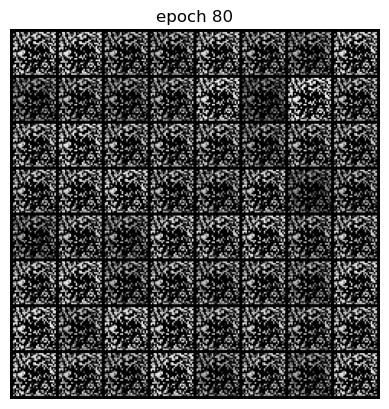

Epoch 80 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000004


118it [00:36,  3.25it/s]                                                                                                


Epoch 81 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000003


118it [00:36,  3.27it/s]                                                                                                


Epoch 82 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000003


118it [00:36,  3.26it/s]                                                                                                


Epoch 83 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000003


118it [00:37,  3.18it/s]                                                                                                


Epoch 84 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000002


118it [00:36,  3.26it/s]                                                                                                
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


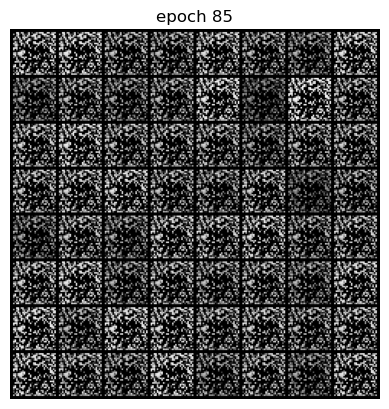

Epoch 85 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000002


118it [00:36,  3.28it/s]                                                                                                


Epoch 86 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000002


118it [00:35,  3.28it/s]                                                                                                


Epoch 87 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000002


118it [00:36,  3.25it/s]                                                                                                


Epoch 88 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000002


118it [00:36,  3.24it/s]                                                                                                


Epoch 89 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000002


118it [00:36,  3.28it/s]                                                                                                
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


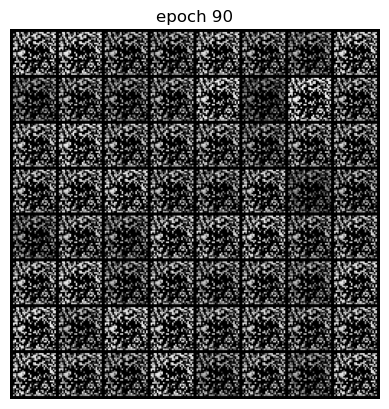

Epoch 90 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000001


118it [00:36,  3.27it/s]                                                                                                


Epoch 91 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000001


118it [00:35,  3.29it/s]                                                                                                


Epoch 92 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000001


118it [00:35,  3.29it/s]                                                                                                


Epoch 93 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000001


118it [00:35,  3.29it/s]                                                                                                


Epoch 94 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000001


118it [00:36,  3.27it/s]                                                                                                
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


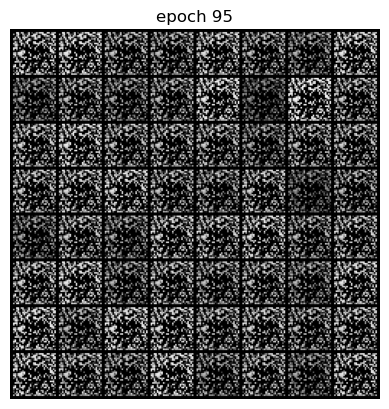

Epoch 95 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000001


118it [00:35,  3.28it/s]                                                                                                


Epoch 96 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000001


118it [00:35,  3.30it/s]                                                                                                


Epoch 97 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000001


118it [00:35,  3.32it/s]                                                                                                


Epoch 98 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000001


118it [00:35,  3.31it/s]                                                                                                


Epoch 99 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000001


118it [00:36,  3.27it/s]                                                                                                
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


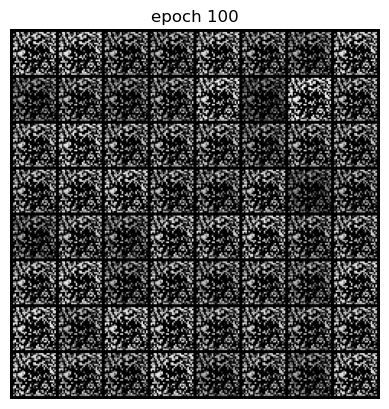

Epoch 100 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000001


In [14]:
torch.manual_seed(7777)

def generator_loss(output, true_label):
    ############ YOUR CODE HERE ##########
    # Generator uses real labels to confuse the discriminator
    noise = create_noise(batch_size, nz)
    gen_output = generator(noise)
    output_fake = discriminator(gen_output)
    return criterion(output_fake, true_label)
    ######################################
    
def discriminator_loss(output, true_label):
    ############ YOUR CODE HERE ##########    
    real_loss = criterion(output, true_label)
    
    noise = create_noise(batch_size, nz)
    # fake data
    fake_data = generator(noise)
    # Detach to avoid backpropagation through the generator
    fake_output = discriminator(fake_data.detach())  
    fake_labels = label_fake(fake_data.size(0))
    fake_loss = criterion(fake_output, fake_labels)

    return real_loss + fake_loss
    ######################################
    
    
for epoch in range(epochs):
    loss_g = 0.0
    loss_d = 0.0
    for bi, data in tqdm(enumerate(train_loader), total=int(len(train_data)/train_loader.batch_size)):
        ############ YOUR CODE HERE ########## 
        real_data, true_label = data
        real_data = real_data.to(device)
        true_label = label_real(real_data.size(0))

        # discriminator
        discriminator.zero_grad()
        dis_output = discriminator(real_data)
        dis_loss = discriminator_loss(dis_output, true_label)
        dis_loss.backward()
        optim_d.step()

        # generator
        generator.zero_grad()
        # we only use the batch size, i.e. the size of real data, below
        gen_loss = generator_loss(real_data, label_fake(batch_size))
        (-gen_loss).backward()
        optim_g.step()

        # total loss
        loss_g += gen_loss.item()
        loss_d += dis_loss.item()
        ######################################
    
    
    # create the final fake image for the epoch
    generated_img = generator(noise).cpu().detach()
    
    # make the images as grid
    generated_img = make_grid(generated_img)
    
    # visualize generated images
    if (epoch + 1) % 5 == 0:
        plt.imshow(generated_img.permute(1, 2, 0))
        plt.title(f'epoch {epoch+1}')
        plt.axis('off')
        plt.show()
    
    # save the generated torch tensor models to disk
    save_generator_image(generated_img, f"outputs/gen_img_b{epoch+1}.png")
    images.append(generated_img)
    epoch_loss_g = loss_g / bi # total generator loss for the epoch
    epoch_loss_d = loss_d / bi # total discriminator loss for the epoch
    losses_g.append(epoch_loss_g)
    losses_d.append(epoch_loss_d)
    
    print(f"Epoch {epoch+1} of {epochs}")
    print(f"Generator loss: {epoch_loss_g:.8f}, Discriminator loss: {epoch_loss_d:.8f}")

In [15]:
print('DONE TRAINING')
torch.save(generator.state_dict(), 'outputs/generator_b.pth')

DONE TRAINING


In [16]:
# save the generated images as GIF file
imgs = [np.array(to_pil_image(img)) for img in images]
imageio.mimsave('outputs/generator_images_b.gif', imgs)

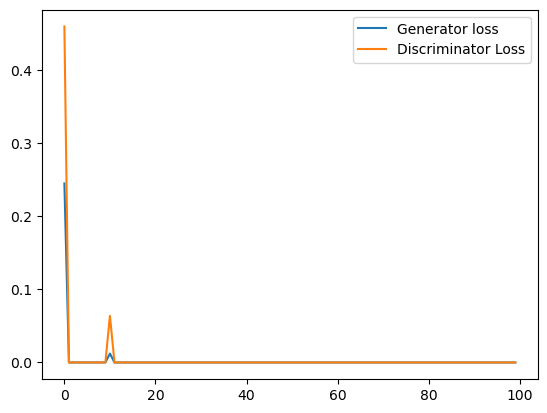

In [17]:
# plot and save the generator and discriminator loss
plt.figure()
plt.plot(losses_g, label='Generator loss')
plt.plot(losses_d, label='Discriminator Loss')
plt.legend()
plt.savefig('outputs/loss_b.png')

# c

In [18]:
transform = transforms.Compose([
                                transforms.ToTensor(),
                                transforms.Normalize((0.5,),(0.5,)),
])
to_pil_image = transforms.ToPILImage()

# Make input, output folders
!mkdir -p input
!mkdir -p outputs

# Load train data
train_data = datasets.MNIST(
    root='input/data',
    train=True,
    download=True,
    transform=transform
)
train_loader = DataLoader(train_data, batch_size=batch_size, shuffle=True)

子目录或文件 -p 已经存在。
处理: -p 时出错。
子目录或文件 input 已经存在。
处理: input 时出错。
子目录或文件 -p 已经存在。
处理: -p 时出错。
子目录或文件 outputs 已经存在。
处理: outputs 时出错。


In [13]:
# optimizers
optim_g = optim.Adam(generator.parameters(), lr=0.0002, betas=(0.5, 0.999))
optim_d = optim.Adam(discriminator.parameters(), lr=0.0002, betas=(0.5, 0.999))
# loss function
criterion = nn.MSELoss() # LSGAN
losses_g = [] # to store generator loss after each epoch
losses_d = [] # to store discriminator loss after each epoch
images = [] # to store images generatd by the generator
# create the noise vector - fixed to track how GAN is trained.
# noise = create_noise(sample_size, nz)

118it [00:29,  3.99it/s]                                                                                                


Epoch 1 of 100
Generator loss: 0.33601448, Discriminator loss: 0.42178383


118it [00:30,  3.93it/s]                                                                                                


Epoch 2 of 100
Generator loss: 0.57355505, Discriminator loss: 0.24741298


118it [00:31,  3.79it/s]                                                                                                


Epoch 3 of 100
Generator loss: 0.82435163, Discriminator loss: 0.12501025


118it [00:30,  3.81it/s]                                                                                                


Epoch 4 of 100
Generator loss: 0.85444409, Discriminator loss: 0.17926580


118it [00:29,  3.97it/s]                                                                                                
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


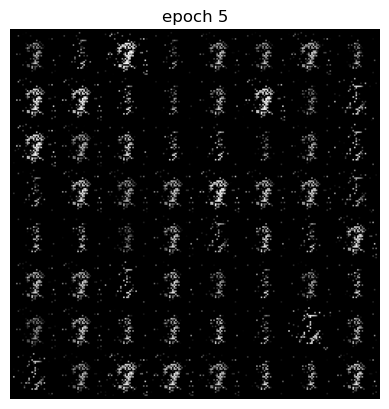

Epoch 5 of 100
Generator loss: 0.83601219, Discriminator loss: 0.20749183


118it [00:29,  4.04it/s]                                                                                                


Epoch 6 of 100
Generator loss: 0.88332704, Discriminator loss: 0.16357634


118it [00:29,  4.02it/s]                                                                                                


Epoch 7 of 100
Generator loss: 0.87833471, Discriminator loss: 0.15797693


118it [00:30,  3.87it/s]                                                                                                


Epoch 8 of 100
Generator loss: 0.88730514, Discriminator loss: 0.14640837


118it [00:31,  3.77it/s]                                                                                                


Epoch 9 of 100
Generator loss: 0.88589150, Discriminator loss: 0.15967392


118it [00:30,  3.88it/s]                                                                                                
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


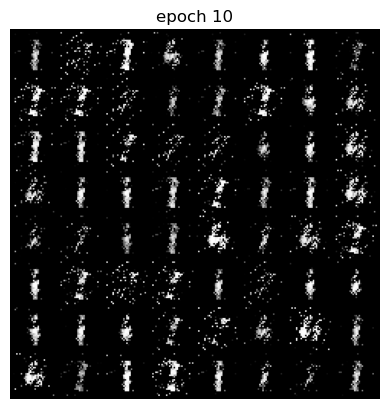

Epoch 10 of 100
Generator loss: 0.86407529, Discriminator loss: 0.17379815


118it [00:29,  3.96it/s]                                                                                                


Epoch 11 of 100
Generator loss: 0.83248243, Discriminator loss: 0.20948551


118it [00:30,  3.84it/s]                                                                                                


Epoch 12 of 100
Generator loss: 0.79798307, Discriminator loss: 0.24707050


118it [00:30,  3.83it/s]                                                                                                


Epoch 13 of 100
Generator loss: 0.82078771, Discriminator loss: 0.18490205


118it [00:30,  3.90it/s]                                                                                                


Epoch 14 of 100
Generator loss: 0.81771386, Discriminator loss: 0.20665735


118it [00:30,  3.90it/s]                                                                                                
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


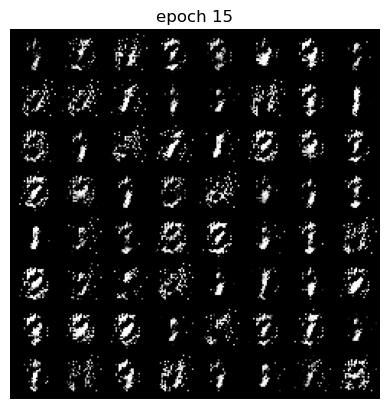

Epoch 15 of 100
Generator loss: 0.78363022, Discriminator loss: 0.21177371


118it [00:30,  3.85it/s]                                                                                                


Epoch 16 of 100
Generator loss: 0.82253605, Discriminator loss: 0.15285088


118it [00:31,  3.78it/s]                                                                                                


Epoch 17 of 100
Generator loss: 0.83724478, Discriminator loss: 0.16470572


118it [00:30,  3.92it/s]                                                                                                


Epoch 18 of 100
Generator loss: 0.85399018, Discriminator loss: 0.12437087


118it [00:30,  3.91it/s]                                                                                                


Epoch 19 of 100
Generator loss: 0.87201717, Discriminator loss: 0.13160448


118it [00:30,  3.81it/s]                                                                                                
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


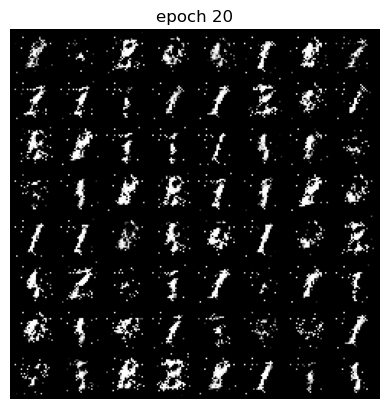

Epoch 20 of 100
Generator loss: 0.83812964, Discriminator loss: 0.15499978


118it [00:30,  3.88it/s]                                                                                                


Epoch 21 of 100
Generator loss: 0.82508401, Discriminator loss: 0.16133928


118it [00:30,  3.83it/s]                                                                                                


Epoch 22 of 100
Generator loss: 0.81994892, Discriminator loss: 0.16454738


118it [00:30,  3.92it/s]                                                                                                


Epoch 23 of 100
Generator loss: 0.78958925, Discriminator loss: 0.19168817


118it [00:29,  3.96it/s]                                                                                                


Epoch 24 of 100
Generator loss: 0.79633026, Discriminator loss: 0.17667703


118it [00:29,  3.97it/s]                                                                                                
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


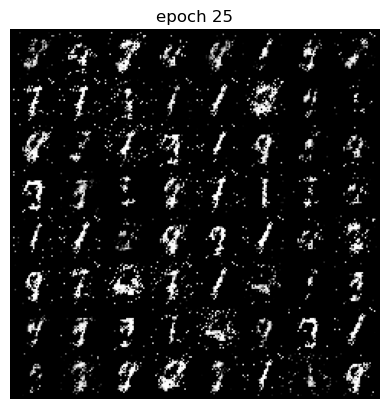

Epoch 25 of 100
Generator loss: 0.76474147, Discriminator loss: 0.22384642


118it [00:29,  4.03it/s]                                                                                                


Epoch 26 of 100
Generator loss: 0.72970620, Discriminator loss: 0.24786869


118it [00:29,  3.96it/s]                                                                                                


Epoch 27 of 100
Generator loss: 0.67526466, Discriminator loss: 0.27171916


118it [00:31,  3.78it/s]                                                                                                


Epoch 28 of 100
Generator loss: 0.63153138, Discriminator loss: 0.29461180


118it [00:31,  3.80it/s]                                                                                                


Epoch 29 of 100
Generator loss: 0.62276522, Discriminator loss: 0.29557847


118it [00:30,  3.87it/s]                                                                                                
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


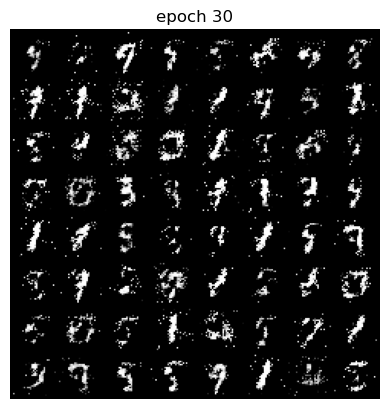

Epoch 30 of 100
Generator loss: 0.62699718, Discriminator loss: 0.28546052


118it [00:30,  3.85it/s]                                                                                                


Epoch 31 of 100
Generator loss: 0.62701510, Discriminator loss: 0.29120229


118it [00:30,  3.82it/s]                                                                                                


Epoch 32 of 100
Generator loss: 0.59813093, Discriminator loss: 0.29518979


118it [00:30,  3.87it/s]                                                                                                


Epoch 33 of 100
Generator loss: 0.57801406, Discriminator loss: 0.31317756


118it [00:30,  3.82it/s]                                                                                                


Epoch 34 of 100
Generator loss: 0.55633899, Discriminator loss: 0.31958531


118it [00:31,  3.78it/s]                                                                                                
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


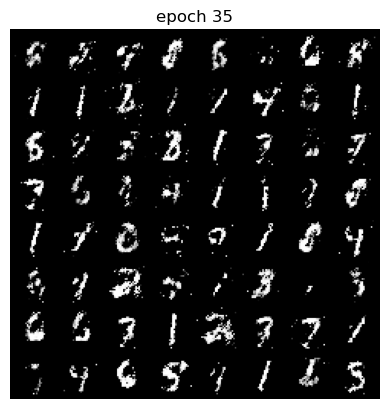

Epoch 35 of 100
Generator loss: 0.56695598, Discriminator loss: 0.30887231


118it [00:30,  3.91it/s]                                                                                                


Epoch 36 of 100
Generator loss: 0.54513449, Discriminator loss: 0.32640497


118it [00:30,  3.87it/s]                                                                                                


Epoch 37 of 100
Generator loss: 0.56208975, Discriminator loss: 0.31146371


118it [00:29,  3.94it/s]                                                                                                


Epoch 38 of 100
Generator loss: 0.54575280, Discriminator loss: 0.32676124


118it [00:30,  3.90it/s]                                                                                                


Epoch 39 of 100
Generator loss: 0.53245476, Discriminator loss: 0.33375133


118it [00:32,  3.60it/s]                                                                                                
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


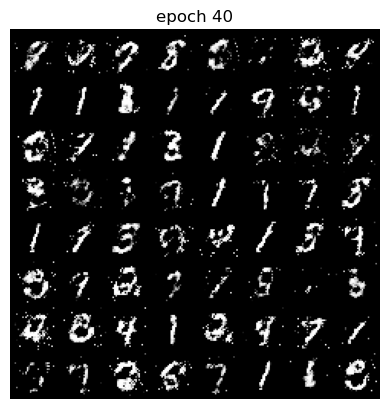

Epoch 40 of 100
Generator loss: 0.51308462, Discriminator loss: 0.34738143


118it [00:32,  3.69it/s]                                                                                                


Epoch 41 of 100
Generator loss: 0.49589365, Discriminator loss: 0.35213028


118it [00:30,  3.91it/s]                                                                                                


Epoch 42 of 100
Generator loss: 0.49399195, Discriminator loss: 0.35858704


118it [00:31,  3.79it/s]                                                                                                


Epoch 43 of 100
Generator loss: 0.50033342, Discriminator loss: 0.35164970


118it [00:30,  3.89it/s]                                                                                                


Epoch 44 of 100
Generator loss: 0.49478676, Discriminator loss: 0.36024038


118it [00:31,  3.71it/s]                                                                                                
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


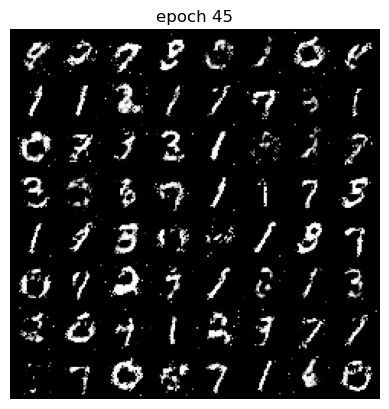

Epoch 45 of 100
Generator loss: 0.48757460, Discriminator loss: 0.36046654


118it [00:31,  3.75it/s]                                                                                                


Epoch 46 of 100
Generator loss: 0.49030806, Discriminator loss: 0.35607199


118it [00:31,  3.80it/s]                                                                                                


Epoch 47 of 100
Generator loss: 0.49876752, Discriminator loss: 0.35439595


118it [00:32,  3.63it/s]                                                                                                


Epoch 48 of 100
Generator loss: 0.48888522, Discriminator loss: 0.35911122


118it [00:31,  3.77it/s]                                                                                                


Epoch 49 of 100
Generator loss: 0.48537539, Discriminator loss: 0.36400313


118it [00:31,  3.75it/s]                                                                                                
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


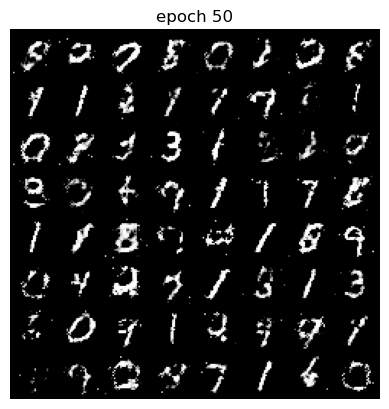

Epoch 50 of 100
Generator loss: 0.48590230, Discriminator loss: 0.35954661


118it [00:31,  3.71it/s]                                                                                                


Epoch 51 of 100
Generator loss: 0.49118145, Discriminator loss: 0.35769669


118it [00:31,  3.71it/s]                                                                                                


Epoch 52 of 100
Generator loss: 0.49257246, Discriminator loss: 0.36240106


118it [00:30,  3.90it/s]                                                                                                


Epoch 53 of 100
Generator loss: 0.48071877, Discriminator loss: 0.36384563


118it [00:30,  3.83it/s]                                                                                                


Epoch 54 of 100
Generator loss: 0.47704512, Discriminator loss: 0.36766088


118it [00:31,  3.80it/s]                                                                                                
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


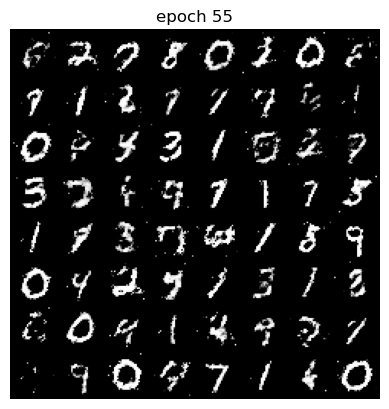

Epoch 55 of 100
Generator loss: 0.47921589, Discriminator loss: 0.36219495


118it [00:31,  3.71it/s]                                                                                                


Epoch 56 of 100
Generator loss: 0.47327976, Discriminator loss: 0.37028135


118it [00:29,  3.96it/s]                                                                                                


Epoch 57 of 100
Generator loss: 0.46948560, Discriminator loss: 0.36999737


118it [00:29,  3.99it/s]                                                                                                


Epoch 58 of 100
Generator loss: 0.47397547, Discriminator loss: 0.37327984


118it [00:29,  3.95it/s]                                                                                                


Epoch 59 of 100
Generator loss: 0.47314093, Discriminator loss: 0.37158222


118it [00:29,  3.95it/s]                                                                                                
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


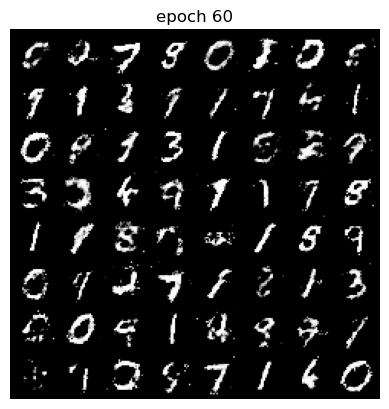

Epoch 60 of 100
Generator loss: 0.46544558, Discriminator loss: 0.37487366


118it [00:29,  3.99it/s]                                                                                                


Epoch 61 of 100
Generator loss: 0.46848158, Discriminator loss: 0.37376384


118it [00:29,  3.94it/s]                                                                                                


Epoch 62 of 100
Generator loss: 0.46854317, Discriminator loss: 0.37416031


118it [00:31,  3.69it/s]                                                                                                


Epoch 63 of 100
Generator loss: 0.46339880, Discriminator loss: 0.38036366


118it [00:30,  3.90it/s]                                                                                                


Epoch 64 of 100
Generator loss: 0.46919327, Discriminator loss: 0.37414088


118it [00:30,  3.87it/s]                                                                                                
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


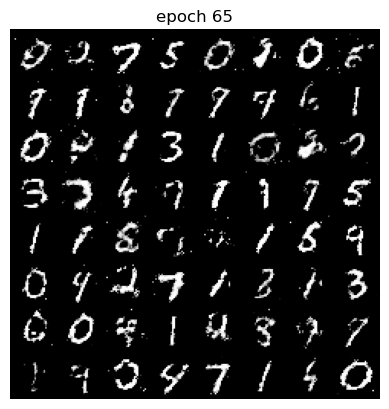

Epoch 65 of 100
Generator loss: 0.45944109, Discriminator loss: 0.38373246


118it [00:30,  3.88it/s]                                                                                                


Epoch 66 of 100
Generator loss: 0.45777080, Discriminator loss: 0.37748645


118it [00:31,  3.80it/s]                                                                                                


Epoch 67 of 100
Generator loss: 0.46157734, Discriminator loss: 0.38165806


118it [00:30,  3.87it/s]                                                                                                


Epoch 68 of 100
Generator loss: 0.45627289, Discriminator loss: 0.38298245


118it [00:30,  3.90it/s]                                                                                                


Epoch 69 of 100
Generator loss: 0.45490193, Discriminator loss: 0.38527088


118it [00:29,  3.96it/s]                                                                                                
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


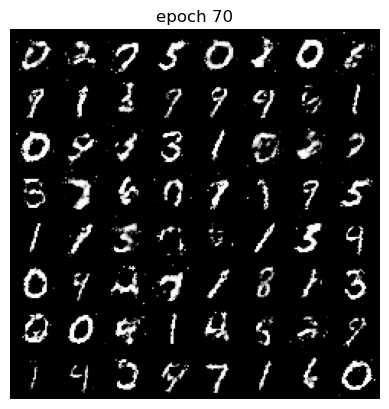

Epoch 70 of 100
Generator loss: 0.45217996, Discriminator loss: 0.38379252


118it [00:29,  3.99it/s]                                                                                                


Epoch 71 of 100
Generator loss: 0.45648445, Discriminator loss: 0.38315658


118it [00:31,  3.73it/s]                                                                                                


Epoch 72 of 100
Generator loss: 0.45222515, Discriminator loss: 0.38830781


118it [00:30,  3.86it/s]                                                                                                


Epoch 73 of 100
Generator loss: 0.45336880, Discriminator loss: 0.38341646


118it [00:31,  3.76it/s]                                                                                                


Epoch 74 of 100
Generator loss: 0.44893731, Discriminator loss: 0.38703633


118it [00:30,  3.89it/s]                                                                                                
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


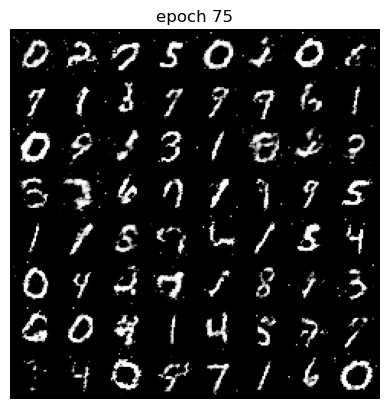

Epoch 75 of 100
Generator loss: 0.44409994, Discriminator loss: 0.38841873


118it [00:31,  3.76it/s]                                                                                                


Epoch 76 of 100
Generator loss: 0.45074167, Discriminator loss: 0.38623582


118it [00:30,  3.88it/s]                                                                                                


Epoch 77 of 100
Generator loss: 0.45046144, Discriminator loss: 0.38742573


118it [00:30,  3.85it/s]                                                                                                


Epoch 78 of 100
Generator loss: 0.44431967, Discriminator loss: 0.38879518


118it [00:30,  3.86it/s]                                                                                                


Epoch 79 of 100
Generator loss: 0.44083217, Discriminator loss: 0.39103210


118it [00:29,  3.96it/s]                                                                                                
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


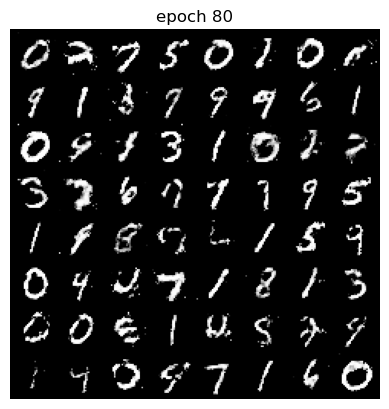

Epoch 80 of 100
Generator loss: 0.44736247, Discriminator loss: 0.38895925


118it [00:30,  3.91it/s]                                                                                                


Epoch 81 of 100
Generator loss: 0.43790278, Discriminator loss: 0.39139699


118it [00:29,  4.00it/s]                                                                                                


Epoch 82 of 100
Generator loss: 0.44305109, Discriminator loss: 0.39101570


118it [00:29,  4.01it/s]                                                                                                


Epoch 83 of 100
Generator loss: 0.44481383, Discriminator loss: 0.38743247


118it [00:29,  4.03it/s]                                                                                                


Epoch 84 of 100
Generator loss: 0.44578440, Discriminator loss: 0.38880671


118it [00:29,  4.00it/s]                                                                                                
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


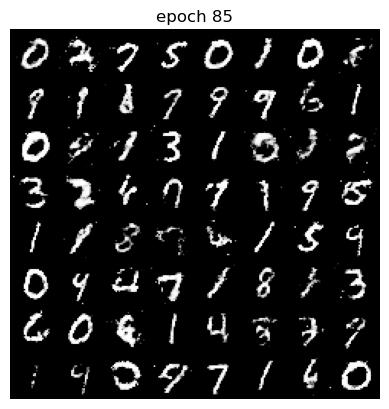

Epoch 85 of 100
Generator loss: 0.44524400, Discriminator loss: 0.38877161


118it [00:31,  3.80it/s]                                                                                                


Epoch 86 of 100
Generator loss: 0.44399883, Discriminator loss: 0.38652586


118it [00:30,  3.89it/s]                                                                                                


Epoch 87 of 100
Generator loss: 0.44122343, Discriminator loss: 0.39341653


118it [00:29,  4.01it/s]                                                                                                


Epoch 88 of 100
Generator loss: 0.44196412, Discriminator loss: 0.38981821


118it [00:29,  3.98it/s]                                                                                                


Epoch 89 of 100
Generator loss: 0.44280239, Discriminator loss: 0.39112224


118it [00:29,  3.96it/s]                                                                                                
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


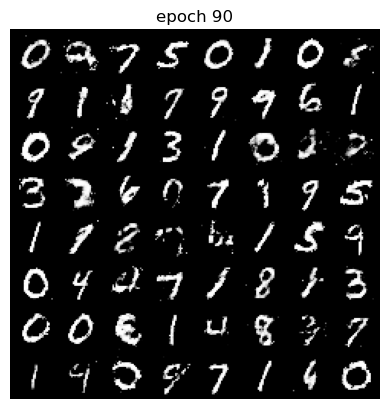

Epoch 90 of 100
Generator loss: 0.44397173, Discriminator loss: 0.38979922


118it [00:29,  4.01it/s]                                                                                                


Epoch 91 of 100
Generator loss: 0.43855421, Discriminator loss: 0.39036955


118it [00:29,  3.98it/s]                                                                                                


Epoch 92 of 100
Generator loss: 0.44360503, Discriminator loss: 0.39148614


118it [00:30,  3.90it/s]                                                                                                


Epoch 93 of 100
Generator loss: 0.44331492, Discriminator loss: 0.39129539


118it [00:29,  3.94it/s]                                                                                                


Epoch 94 of 100
Generator loss: 0.44634441, Discriminator loss: 0.38859363


118it [00:29,  3.99it/s]                                                                                                
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


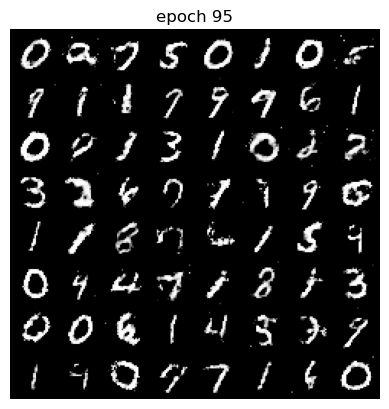

Epoch 95 of 100
Generator loss: 0.43979623, Discriminator loss: 0.39376247


118it [00:30,  3.86it/s]                                                                                                


Epoch 96 of 100
Generator loss: 0.44244199, Discriminator loss: 0.39017974


118it [00:29,  3.96it/s]                                                                                                


Epoch 97 of 100
Generator loss: 0.43576069, Discriminator loss: 0.39440126


118it [00:29,  3.94it/s]                                                                                                


Epoch 98 of 100
Generator loss: 0.43378687, Discriminator loss: 0.39506231


118it [00:29,  4.00it/s]                                                                                                


Epoch 99 of 100
Generator loss: 0.43479570, Discriminator loss: 0.39348488


118it [00:29,  3.97it/s]                                                                                                
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


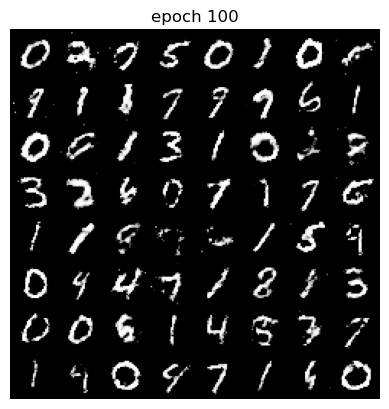

Epoch 100 of 100
Generator loss: 0.43992155, Discriminator loss: 0.39243359


In [14]:
torch.manual_seed(7777)

def generator_loss(output, true_label):
    ############ YOUR CODE HERE ##########
    # Generator uses real labels to confuse the discriminator
    noise = create_noise(batch_size, nz)
    gen_output = generator(noise)
    output_fake = discriminator(gen_output)
    return criterion(output_fake, true_label)
    ######################################
    
def discriminator_loss(output, true_label):
    ############ YOUR CODE HERE ##########    
    real_loss = criterion(output, true_label)
    
    noise = create_noise(batch_size, nz)
    # fake data
    fake_data = generator(noise)
    # Detach to avoid backpropagation through the generator
    fake_output = discriminator(fake_data.detach())  
    fake_labels = label_fake(fake_data.size(0))
    fake_loss = criterion(fake_output, fake_labels)

    return real_loss + fake_loss
    ######################################
    
    
for epoch in range(epochs):
    loss_g = 0.0
    loss_d = 0.0
    for bi, data in tqdm(enumerate(train_loader), total=int(len(train_data)/train_loader.batch_size)):
        ############ YOUR CODE HERE ########## 
        real_data, true_label = data
        real_data = real_data.to(device)
        true_label = label_real(real_data.size(0))

        # discriminator
        discriminator.zero_grad()
        dis_output = discriminator(real_data)
        dis_loss = discriminator_loss(dis_output, true_label)
        dis_loss.backward()
        optim_d.step()

        # generator
        generator.zero_grad()
        # we only use the batch size, i.e. the size of real data, below
        gen_loss = generator_loss(real_data, label_real(batch_size))
        gen_loss.backward()
        optim_g.step()

        # total loss
        loss_g += gen_loss.item()
        loss_d += dis_loss.item()
        ######################################
    
    
    # create the final fake image for the epoch
    generated_img = generator(noise).cpu().detach()
    
    # make the images as grid
    generated_img = make_grid(generated_img)
    
    # visualize generated images
    if (epoch + 1) % 5 == 0:
        plt.imshow(generated_img.permute(1, 2, 0))
        plt.title(f'epoch {epoch+1}')
        plt.axis('off')
        plt.show()
    
    # save the generated torch tensor models to disk
    save_generator_image(generated_img, f"outputs/gen_img{epoch+1}.png")
    images.append(generated_img)
    epoch_loss_g = loss_g / bi # total generator loss for the epoch
    epoch_loss_d = loss_d / bi # total discriminator loss for the epoch
    losses_g.append(epoch_loss_g)
    losses_d.append(epoch_loss_d)
    
    print(f"Epoch {epoch+1} of {epochs}")
    print(f"Generator loss: {epoch_loss_g:.8f}, Discriminator loss: {epoch_loss_d:.8f}")

In [15]:
print('DONE TRAINING')
torch.save(generator.state_dict(), 'outputs/generator.pth')

DONE TRAINING


In [16]:
# save the generated images as GIF file
imgs = [np.array(to_pil_image(img)) for img in images]
imageio.mimsave('outputs/generator_images.gif', imgs)

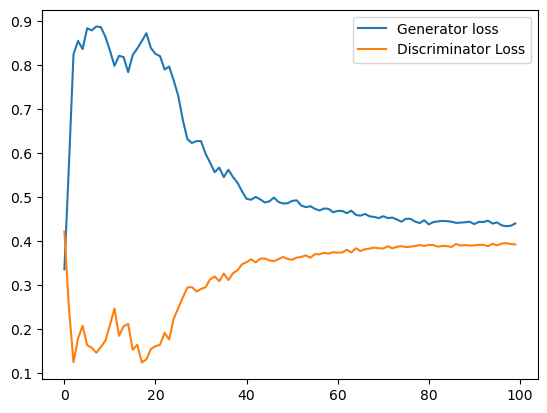

In [17]:
# plot and save the generator and discriminator loss
plt.figure()
plt.plot(losses_g, label='Generator loss')
plt.plot(losses_d, label='Discriminator Loss')
plt.legend()
plt.savefig('outputs/loss.png')